# Reading from PDF

In [1]:
# !pip install -r requirements.txt

In [5]:
!conda install --yes -c conda-forge --file requirements.txt

Solving environment: done

## Package Plan ##

  environment location: /anaconda3/envs/Pythondata

  added / updated specs:
    - pdf2image
    - poppler
    - pypdf2
    - pytesseract
    - tabula-py
    - wand


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    fftw-3.3.8                 |nompi_h5c49c53_1109         5.2 MB  conda-forge
    flake8-3.7.9               |           py36_0         128 KB  conda-forge
    flake8-polyfill-1.0.2      |             py_0           8 KB  conda-forge
    flake8-quotes-2.1.1        |             py_0          11 KB  conda-forge
    font-ttf-dejavu-sans-mono-2.37|       hab24e00_0         388 KB  conda-forge
    font-ttf-inconsolata-2.001 |       hab24e00_0          97 KB  conda-forge
    font-ttf-source-code-pro-2.030|       hab24e00_0         927 KB  conda-forge
    font-ttf-ubuntu-0.83       |       hab24e00_0         1.9 MB  conda-forge
    fonts-

In [2]:
# Sample data
businesscard = './Data/English/Business_cards/doc10003.tif'
mobile = './Data/English/Mobile_Photos/MobPhoto_3.jpg'
scan = './Data/English/Scanned_documents/Picture_003.jpg'

items = [businesscard, mobile, scan]

In [3]:
items

['./Data/English/Business_cards/doc10003.tif',
 './Data/English/Mobile_Photos/MobPhoto_3.jpg',
 './Data/English/Scanned_documents/Picture_003.jpg']

In [4]:
from PIL import Image

In [5]:
Image.open(businesscard)

OSError: -2

<PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=709x394 at 0x1299A461B00>

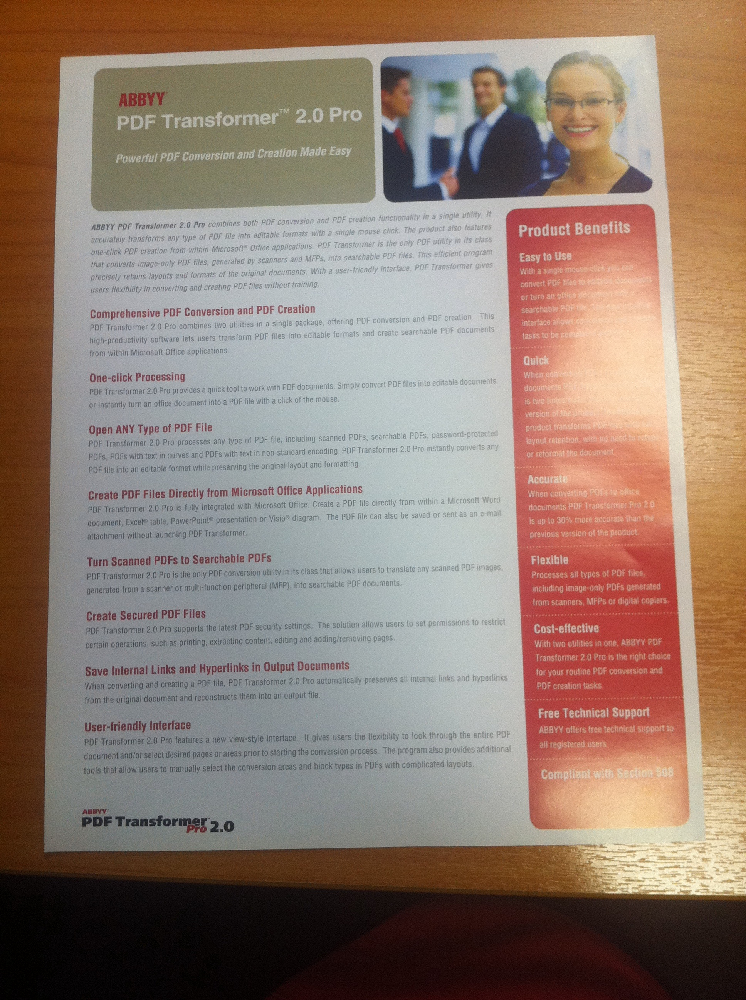

In [6]:
Image.open(mobile)

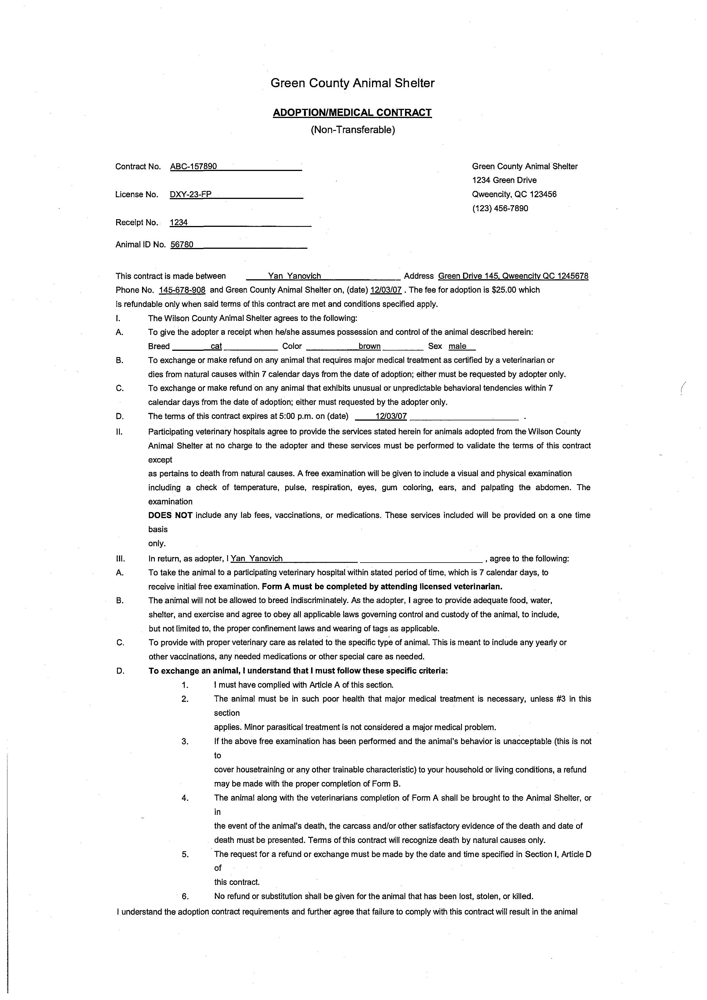

In [7]:
Image.open(scan)

In [8]:
import pytesseract
import re

In [9]:
content = [pytesseract.image_to_string(i) for i in items]

TesseractNotFoundError: tesseract is not installed or it's not in your path

In [27]:
content[0]

'ABBYY\n\nJohn Smith ABBYY Headquarters\nOtradnaya str, 2b, bld. 6,\n127273, Moscow, Russia\n\nTel: +7 (495) 783 3700\nFax: +7 (495) 783 2663\n\nProduct Analyst\n\njohn_sm@abbyy.com\nwww.ABBYY.com'

In [26]:
print(content[0])

ABBYY

John Smith ABBYY Headquarters
Otradnaya str, 2b, bld. 6,
127273, Moscow, Russia

Tel: +7 (495) 783 3700
Fax: +7 (495) 783 2663

Product Analyst

john_sm@abbyy.com
www.ABBYY.com


### Extracting email addressses from Business Cards

In [25]:
regex = re.compile(r'\w+@\w+\.com')
regex.findall(content[0])

['john_sm@abbyy.com']

In [21]:
content[1]

'ABBYY PDF Transformer 2.0 Pro\n\n  \n\nPOF Transformer 2,0 Pro\n\nhigh-productiv\n\n  \n \n\nfrom within Micr\n\n \n\nOne-click P\nPDF Transtormer 2.0 Pro provides a quick to\nor instantly turn an office document into a PDF file with a\n\n \n\n \n\nOpen ANY Type of PDF File\nPDF Transformer 2.0 Pro processes any type of F\nPDFs, PDFs with text in curves and PDFs with text in non\n\nthe orig\n\nPDF file into an editable format while preserving t\n\n \n  \n \n  \n\nCreate PDF Files Directly from M\nPDF Transformer 2.0 Pro is fully integrated with Microsoft Offi\ndocument, Excel® table, PowerPoint® presentation or Visio® diagram\nattachment without launching PDF Transformer\n\n \n\nTurn Scanned PDFs to Searchable PDFs\nPDF Transformer 2.0 Pro is the only PDF conversion utility in its cl\n\n  \n \n \n \n\n \n\nCreate Secured PDF Files\nPDF Transformer 2.0 Pro supports the latest PDF security settings. The\n\ncertain operations, such as printing, extracting content, editing and adding/remi

In [28]:
print(content[1])

ABBYY PDF Transformer 2.0 Pro

  

POF Transformer 2,0 Pro

high-productiv

  
 

from within Micr

 

One-click P
PDF Transtormer 2.0 Pro provides a quick to
or instantly turn an office document into a PDF file with a

 

 

Open ANY Type of PDF File
PDF Transformer 2.0 Pro processes any type of F
PDFs, PDFs with text in curves and PDFs with text in non

the orig

PDF file into an editable format while preserving t

 
  
 
  

Create PDF Files Directly from M
PDF Transformer 2.0 Pro is fully integrated with Microsoft Offi
document, Excel® table, PowerPoint® presentation or Visio® diagram
attachment without launching PDF Transformer

 

Turn Scanned PDFs to Searchable PDFs
PDF Transformer 2.0 Pro is the only PDF conversion utility in its cl

  
 
 
 

 

Create Secured PDF Files
PDF Transformer 2.0 Pro supports the latest PDF security settings. The

certain operations, such as printing, extracting content, editing and adding/remic

Save Internal Links and Hyperlinks in Output Docume
Wh

### Capturing Number of occurances 

In [34]:
regex = re.compile(r'PDF Transformer')
for i, match in enumerate(regex.finditer(content[1])):
    print(i+1, match)


1 <_sre.SRE_Match object; span=(6, 21), match='PDF Transformer'>
2 <_sre.SRE_Match object; span=(252, 267), match='PDF Transformer'>
3 <_sre.SRE_Match object; span=(465, 480), match='PDF Transformer'>
4 <_sre.SRE_Match object; span=(625, 640), match='PDF Transformer'>
5 <_sre.SRE_Match object; span=(682, 697), match='PDF Transformer'>
6 <_sre.SRE_Match object; span=(790, 805), match='PDF Transformer'>
7 <_sre.SRE_Match object; span=(1039, 1054), match='PDF Transformer'>
8 <_sre.SRE_Match object; span=(1183, 1198), match='PDF Transformer'>


In [23]:
content[2]

"Green County Animal Shelter\n\nADOPTION/MEDICAL CONTRACT\n\n(Non-Transferable)\n\nContract No. ABC-157890 Green County Animal Shelter\n\n1234 Green Drive\n\nLicense No. DXY-23-FP. Qweencity, QC 123456\n\n(123) 456-7890\n\nReceipt No.. 1234\n\nAnimal ID No. 56780\n\nThis contract is made between Yan_Yanovich Address Green Drive 145, Qweencity QC 1245678\nPhone No. 145-678-908 and Green County Animal Shelter on, (date) 12/03/07 . The fee for adoption is $25.00 which\nis refundable only when said terms of this contract are met and conditions specified apply.\n\nA.\n\nThe Wilson County Animal Shelter agrees to the following:\n\nTo give the adopter a receipt when he/she assumes possession and control of the animal described herein:\n\nBreed cat Color brown Sex male _\n\nTo exchange or make refund on any animal that requires major medical treatment as certified by a veterinarian or\n\ndies from natural causes within 7 calendar days from the date of adoption; either must be requested by adop

In [29]:
print(content[2])

Green County Animal Shelter

ADOPTION/MEDICAL CONTRACT

(Non-Transferable)

Contract No. ABC-157890 Green County Animal Shelter

1234 Green Drive

License No. DXY-23-FP. Qweencity, QC 123456

(123) 456-7890

Receipt No.. 1234

Animal ID No. 56780

This contract is made between Yan_Yanovich Address Green Drive 145, Qweencity QC 1245678
Phone No. 145-678-908 and Green County Animal Shelter on, (date) 12/03/07 . The fee for adoption is $25.00 which
is refundable only when said terms of this contract are met and conditions specified apply.

A.

The Wilson County Animal Shelter agrees to the following:

To give the adopter a receipt when he/she assumes possession and control of the animal described herein:

Breed cat Color brown Sex male _

To exchange or make refund on any animal that requires major medical treatment as certified by a veterinarian or

dies from natural causes within 7 calendar days from the date of adoption; either must be requested by adopter only.

To exchange or make re

### Extracting Contract No. Example

In [37]:
regex = re.compile(r'Contract No.')
for match in regex.finditer(content[2]):
    print(match)

<_sre.SRE_Match object; span=(76, 88), match='Contract No.'>


In [55]:
regex = re.compile(r'(Contract No.\s)(\w{3}-\d{6})')
for match in regex.finditer(content[2]):
    print(match.groups())

('Contract No. ', 'ABC-157890')


In [57]:
for match in regex.finditer(content[2]):
    print(match.groups()[1])

ABC-157890
